<a href="https://colab.research.google.com/github/yantiputri/SEMESTER-3/blob/main/tugas11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import Library

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from folium.plugins import HeatMap
import folium

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
path = '/content/drive/MyDrive/Praktikum_ml/tugas11'

Load Dataset GPS

In [5]:
df = pd.read_csv ("/content/drive/MyDrive/Praktikum_ml/tugas11/data/database.csv")
df.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [6]:
df = df[['Latitude','Longitude']].dropna()

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23412 entries, 0 to 23411
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Latitude   23412 non-null  float64
 1   Longitude  23412 non-null  float64
dtypes: float64(2)
memory usage: 365.9 KB


In [8]:
df.describe()

,Latitude,Longitude
count,23412.000000,23412.000000
mean,1.679033,39.639961
std,30.113183,125.511959
min,-77.080000,-179.997000
25%,-18.653000,-76.349750
50%,-3.568500,103.982000
75%,26.190750,145.026250
max,86.005000,179.998000


Ambil Kolom Latitude & Longitude

In [14]:
coords = df[["Latitude", "Longitude"]].copy()
coords.head()

,Latitude,Longitude
0,19.246,145.616
1,1.863,127.352
2,-20.579,-173.972
3,-59.076,-23.557
4,11.938,126.427


Standarisasi Data

In [16]:
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

Menentukan eps – K-Distance Graph

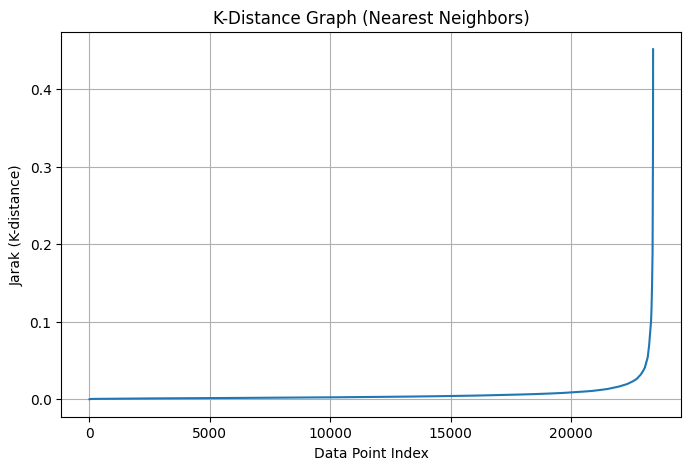

In [21]:
# Membuat model Nearest Neighbors
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(coords_scaled)

# Mendapatkan jarak k-distance
distances, indices = neighbors_fit.kneighbors(coords_scaled)

# Sort jarak untuk mencari elbow point
distances_sorted = np.sort(distances[:, 3])

plt.figure(figsize=(8,5))
plt.plot(distances_sorted)
plt.title("K-Distance Graph (Nearest Neighbors)")
plt.xlabel("Data Point Index")
plt.ylabel("Jarak (K-distance)")
plt.grid(True)
plt.show()

Proses Clustering Menggunakan DBSCAN

In [17]:
db = DBSCAN(eps=0.25, min_samples=5).fit(coords_scaled)
labels = db.labels_

df["cluster"] = labels
df.head()

,Latitude,Longitude,cluster
0,19.246,145.616,0
1,1.863,127.352,0
2,-20.579,-173.972,0
3,-59.076,-23.557,0
4,11.938,126.427,0


Scatter Plot Hasil Clustering

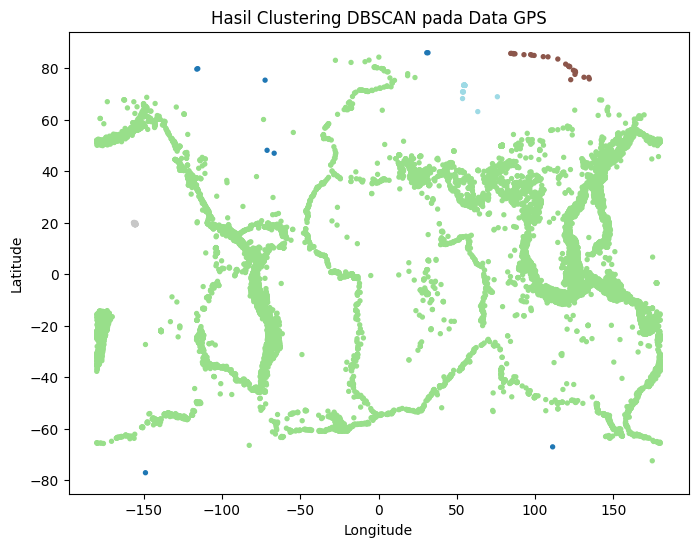

In [18]:
plt.figure(figsize=(8,6))
plt.scatter(df['Longitude'], df['Latitude'], c=df['cluster'], cmap='tab20', s=8)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Hasil Clustering DBSCAN pada Data GPS")
plt.show()

Peta Sebaran Titik (Scatter Map – Folium)

In [19]:
# Titik tengah peta berdasarkan rata-rata koordinat
center_lat = df["Latitude"].mean()
center_lon = df["Longitude"].mean()

scatter_map = folium.Map(location=[center_lat, center_lon], zoom_start=5)

# Tambah titik
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=2,
        color="blue",
        fill=True,
        fill_opacity=0.6
    ).add_to(scatter_map)

scatter_map


Barplot Top 5 & Bottom 5 Cluster

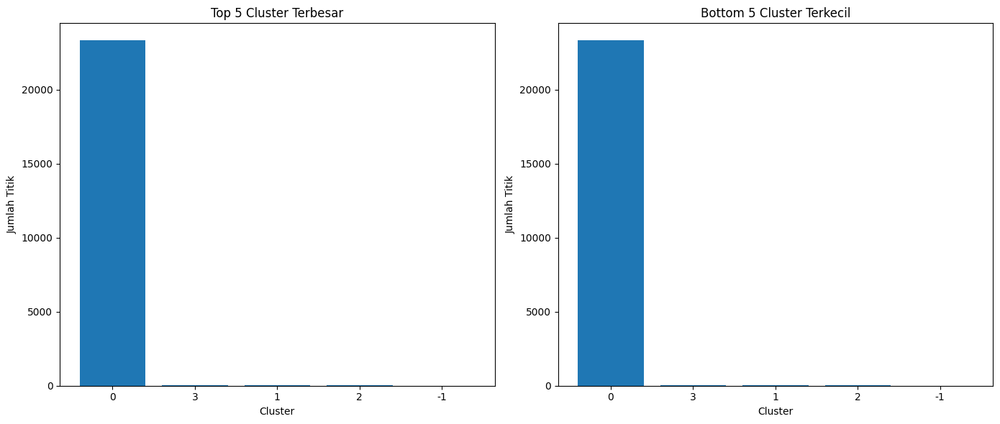

In [22]:
cluster_counts = df["cluster"].value_counts().sort_values(ascending=False)

top5 = cluster_counts.head(5)
bottom5 = cluster_counts.tail(5)

plt.figure(figsize=(14,6))

# TOP 5
plt.subplot(1,2,1)
plt.bar(top5.index.astype(str), top5.values)
plt.title("Top 5 Cluster Terbesar")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Titik")

# BOTTOM 5
plt.subplot(1,2,2)
plt.bar(bottom5.index.astype(str), bottom5.values)
plt.title("Bottom 5 Cluster Terkecil")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Titik")

plt.tight_layout()
plt.show()


## Kesimpulan Praktikum DBSCAN

1. K-Distance Graph digunakan untuk menentukan nilai eps optimal dengan melihat elbow point.
2. DBSCAN mampu mengelompokkan lokasi GPS berdasarkan density tanpa menentukan jumlah cluster di awal.
3. Scatter plot menunjukkan pola penyebaran cluster secara jelas.
4. Peta Folium memperlihatkan lokasi sebaran titik secara geografis sehingga analisis lebih mudah dipahami.
5. Barplot Top 5 & Bottom 5 memberikan gambaran cluster dengan titik terbanyak dan tersedikit.
6. Secara keseluruhan, DBSCAN efektif untuk data geospasial seperti koordinat gempa.
